<a href="https://colab.research.google.com/github/BenjaAR/PROYECT_TOMATE/blob/main/plant_diseases_detection_pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<p style="text-align:center;"><span style="font-size:48px;"><span style="color:#00A36C;"><span style="font-family:cursive;"> Hello everyone! </span> </span>  </span></p>

![R (2).jfif](attachment:6496f875-9796-4a65-b7ba-03051fb9a05e.jfif)

<a id="0"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Table of Contents 💻</p>

<div style = 'border : 3px solid non; background-color:#ECFFDC
              ;font-family:Times New Roman;
              font-size:110%;padding:10px'>

    
    
* **[1. A Brief Explanation](#1)**
   
   - Plant Diseases Detection?
    
   - Why Pytorch and CNN?
    
    
* **[2. Import Libraries ](#2)**
    
   - Libraries that we need
    
  
* **[3. Import Dataset ](#3)**  
    
   - Use Directories
  
   
* **[4. Data Preprocessing ](#4)**
    
   - Name of Classes and Number of Them
    
   - A Plot of Each Classes
    
   - Comparing the Number of Classes
    
   - ImageFolder, ToTensor
    
   - DataLoader
    
   
* **[5. Device of Process ](#5)**
    
   - GPU/CPU
    
   - Data to Device
    
   - Device DataLoader
    
    
* **[6. Neural Network (CNN) ](#6)**
    
   - Function of Acc
    
   - Classification Base
    
   - ConvBlock
    
   - CNN
    
   - Model
    
   - Model Evaluate / Model Optimizer
    
   - Hyperparameters Function
    
   - Training Model
    
    
 * **[7. Result ](#7)**
    
   - Acc/Loss Plot
    
   - Use Model for Test Dataset
    
   - Final Prediction
    

<a id="1"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">A Brief Explanation</p>

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

* **¿Detección de enfermedades de las plantas?**

- La detección de enfermedades de las plantas es crucial por varias razones:

**Productividad agrícola:** La identificación temprana de enfermedades puede prevenir brotes generalizados, garantizando así la salud y el rendimiento de los cultivos.

**Impacto económico:** Minimizar las pérdidas de cultivos causadas por enfermedades afecta directamente la estabilidad económica de los agricultores y del sector agrícola.

**Seguridad alimentaria:** Proteger los cultivos de las enfermedades es esencial para mantener un suministro estable de alimentos para la creciente población mundial.

**Protección del medio ambiente:** Un manejo eficaz de las enfermedades reduce la necesidad de tratamientos químicos, protegiendo así el medio ambiente.
    

![R (3).jfif](attachment:62189a19-f887-43fb-af68-bc716d1254ef.jfif)

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

* **¿Por qué PyTorch y CNN?**

- PyTorch y las Redes Neuronales Convolucionales (CNN) son especialmente adecuadas para la detección de enfermedades en plantas por varias razones:

**Facilidad de uso:** PyTorch proporciona una plataforma flexible para la investigación y el desarrollo de aprendizaje profundo, fácil de usar tanto para principiantes como para expertos.

**Gráficos de Computación Dinámica:** PyTorch permite gráficos de computación dinámica, esenciales para entradas y salidas de longitud variable, algo común en tareas basadas en imágenes.

**Extracción Efectiva de Características:** Las CNN son potentes para extraer características jerárquicas de imágenes, lo cual es crucial para identificar patrones indicativos de enfermedades en plantas.

**Avances en aprendizaje profundo:** El aprendizaje profundo, en particular las CNN, ha logrado avances significativos en el procesamiento de imágenes digitales, superando a los métodos tradicionales en precisión y eficiencia.
    

* **[Table of Content](#0)**

#2️⃣ Comprensión de los datos (Data Understanding)
python
Copiar
Editar


In [1]:
!pip install colorama


<a id="2"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Import Libraries</p>

In [2]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from PIL import Image
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import torch.optim as optim
import torch.nn.functional as F
import colorama
from colorama import Fore, Style

* **[Table of Content](#0)**

<a id="3"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Import Dataset</p>

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


* **Use Directories**

  - The main Root of dataset contains 2 folder (New Plant Diseases Dataset (Augmented)) and (Test). In the first one, we can see the directory of **Train** and **Valid** and in the second one, we have our **Test** images.
    
  - The os.listdir() method in Python is used to get the list of all files and directories in the specified directory. If we don’t specify any directory, then a list of files and directories in the current working directory will be returned.

In [3]:
from google.colab import files
files.upload()


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"benjyalvaroaquinorey","key":"5761d8d695a0710c41aaf7125b12172f"}'}

In [4]:
import os

# Crear la carpeta de configuración
os.makedirs("/root/.kaggle", exist_ok=True)

# Mover kaggle.json al lugar correcto
!mv kaggle.json /root/.kaggle/

# Cambiar permisos para mayor seguridad
!chmod 600 /root/.kaggle/kaggle.json


In [5]:
# Instalar la librería de Kaggle (si no lo hiciste aún)
!pip install -q kaggle

# Descargar el dataset completo (sí, los 3 GB, en Colab se puede)
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset

Dataset URL: https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset
License(s): copyright-authors
 99% 2.68G/2.70G [00:28<00:00, 311MB/s]
100% 2.70G/2.70G [00:28<00:00, 100MB/s]


In [6]:
import os
import zipfile

# 1. Descomprimir el ZIP
zip_path = "/content/new-plant-diseases-dataset.zip"
extract_path = "/content/plant_disease_data"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# 2. Revisar qué carpetas hay (esto ayuda a confirmar la estructura)
print(os.listdir(extract_path))


['new plant diseases dataset(augmented)', 'test', 'New Plant Diseases Dataset(Augmented)']


In [7]:
# 3. Definir correctamente los directorios
Root_dir = os.path.join(extract_path, 'New Plant Diseases Dataset(Augmented)', 'New Plant Diseases Dataset(Augmented)')
train_dir = os.path.join(Root_dir, 'train')
valid_dir = os.path.join(Root_dir, 'valid')
test_dir = os.path.join(extract_path, 'test')
Diseases_classes = os.listdir(train_dir)

In [ ]:
Root_dir = "/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)"
train_dir = Root_dir + "/train"
valid_dir = Root_dir + "/valid"
test_dir = "/kaggle/input/new-plant-diseases-dataset/test"
Diseases_classes = os.listdir(train_dir)

FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'

* **[Table of Content](#0)**

<a id="4"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Data Preprocessing</p>

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


* **Name of Classes and Number of Them**

  - How many classes are in the dataset?

In [8]:
print(Fore.GREEN +str(Diseases_classes))
print("\nTotal number of classes are: ", len(Diseases_classes))

['Grape___healthy', 'Pepper,_bell___healthy', 'Tomato___Leaf_Mold', 'Raspberry___healthy', 'Tomato___healthy', 'Tomato___Tomato_mosaic_virus', 'Corn_(maize)___Common_rust_', 'Tomato___Septoria_leaf_spot', 'Orange___Haunglongbing_(Citrus_greening)', 'Strawberry___healthy', 'Tomato___Early_blight', 'Blueberry___healthy', 'Potato___Late_blight', 'Pepper,_bell___Bacterial_spot', 'Cherry_(including_sour)___Powdery_mildew', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___Target_Spot', 'Soybean___healthy', 'Corn_(maize)___healthy', 'Peach___Bacterial_spot', 'Apple___Cedar_apple_rust', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Grape___Black_rot', 'Tomato___Bacterial_spot', 'Apple___Black_rot', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Apple___Apple_scab', 'Strawberry___Leaf_scorch', 'Potato___Early_blight', 'Tomato___Late_blight', 'Apple___healthy', 'Cherry_(including_sour)___healthy', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Squash___Powdery_mildew', 'Tomato___Toma

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


* **Name of Classes and Number of Them**

  - How many image are in each classes?
    
  - Also you can see the plot of each classes

In [9]:
plt.figure(figsize=(60,60), dpi=200)
cnt = 0
plant_names = []
tot_images = 0

for i in Diseases_classes:
    cnt += 1
    plant_names.append(i)
    plt.subplot(7,7,cnt)

    image_path = os.listdir(train_dir + "/" + i)
    print(Fore.GREEN)
    print("The Number of Images in " +i+ ":", len(image_path), end= " ")
    tot_images += len(image_path)

    img_show = plt.imread(train_dir + "/" + i + "/" + image_path[0])

    plt.imshow(img_show)
    plt.xlabel(i,fontsize=30)
    plt.xticks([])
    plt.yticks([])


print("\nTotal Number of Images in Directory: ", tot_images)


The Number of Images in Grape___healthy: 1692 
The Number of Images in Pepper,_bell___healthy: 1988 
The Number of Images in Tomato___Leaf_Mold: 1882 
The Number of Images in Raspberry___healthy: 1781 
The Number of Images in Tomato___healthy: 1926 
The Number of Images in Tomato___Tomato_mosaic_virus: 1790 
The Number of Images in Corn_(maize)___Common_rust_: 1907 
The Number of Images in Tomato___Septoria_leaf_spot: 1745 
The Number of Images in Orange___Haunglongbing_(Citrus_greening): 2010 
The Number of Images in Strawberry___healthy: 1824 
The Number of Images in Tomato___Early_blight: 1920 
The Number of Images in Blueberry___healthy: 1816 
The Number of Images in Potato___Late_blight: 1939 
The Number of Images in Pepper,_bell___Bacterial_spot: 1913 
The Number of Images in Cherry_(including_sour)___Powdery_mildew: 1683 
The Number of Images in Corn_(maize)___Northern_Leaf_Blight: 1908 
The Number of Images in Tomato___Target_Spot: 1827 
The Number of Images in Soybean___healt

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


* **Comparing the Number of Classes**

  - It's really important to know which classes have the most images and which have the lowest.

* **[Table of Content](#0)**

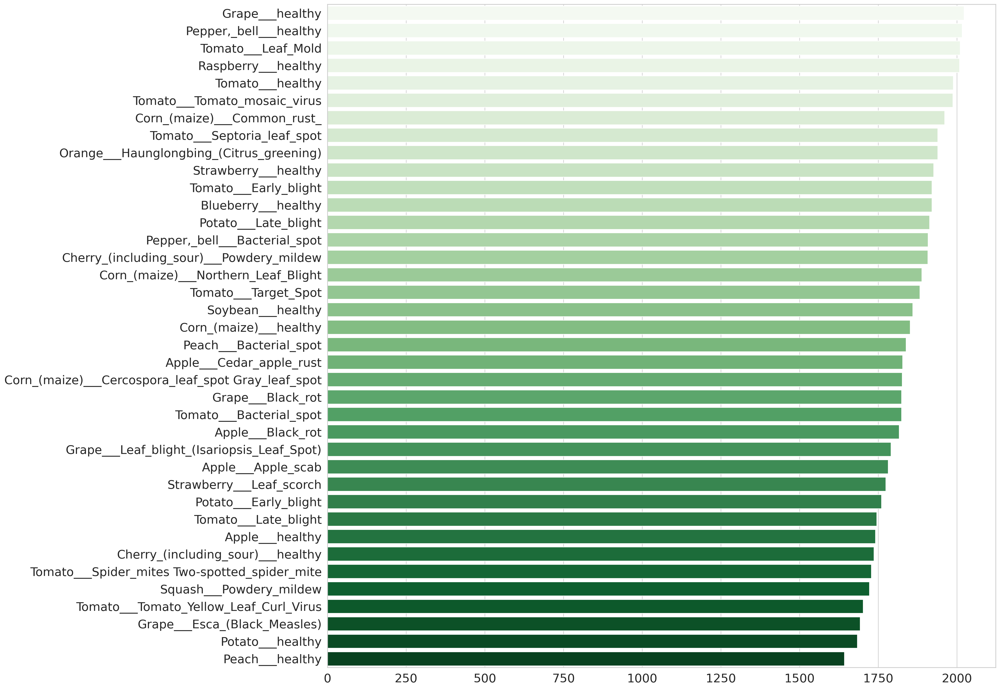

In [10]:
plant_names = []
Len = []
for i in Diseases_classes:
    plant_names.append(i)
    imgs_path = os.listdir(train_dir + "/" + i)
    Len.append(len(imgs_path))

Len.sort(reverse=True)

sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(20,20),dpi=200)
ax = sns.barplot(x= Len, y= plant_names, palette="Greens")
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

#3️⃣ Preparación de los datos (Data Preparation)
python
Copiar
Editar


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

* **ImageFolder/ ToTensor**

- La clase ImageFolder de PyTorch, parte de la biblioteca Torchvision, es un cargador de datos versátil, diseñado específicamente para gestionar conjuntos de datos de imágenes. Simplifica el proceso de carga y organización de datos de imágenes para el entrenamiento de modelos de aprendizaje automático. Profundicemos en sus detalles:
Propósito: La clase ImageFolder se utiliza para cargar datos de imágenes desde una estructura de directorios donde las imágenes se organizan en subcarpetas que representan diferentes clases o categorías. Por defecto, asume la siguiente estructura de directorios:

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

    root/
    ├── class_1/
    │   ├── image1.jpg
    │   ├── image2.jpg
    │   └── ...
    ├── class_2/
    │   ├── image3.jpg
    │   ├── image4.jpg
    │   └── ...
    └── ...


transform=transforms.ToTensor()
Esto aplica una transformación a cada imagen antes de usarla.
transforms.ToTensor() convierte la imagen (por defecto en formato PIL) a un tensor PyTorch, que es el formato que necesita la red neuronal.

Convierte los valores de píxeles de [0, 255] a [0.0, 1.0]

Reorganiza los canales a formato (C, H, W) (canales, alto, ancho)

In [11]:
train = ImageFolder(train_dir, transform=transforms.ToTensor())
valid = ImageFolder(valid_dir, transform=transforms.ToTensor())

✅ Resultado:
train y valid ahora son objetos tipo ImageFolder que contienen:

Las rutas de imágenes

Las etiquetas de clase (automáticamente asignadas según los nombres de las carpetas)

Las imágenes ya transformadas a tensores

In [12]:
train

Dataset ImageFolder
    Number of datapoints: 70295
    Root location: /content/plant_disease_data/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train
    StandardTransform
Transform: ToTensor()

In [13]:
train[0]

(tensor([[[0.6549, 0.6510, 0.6471,  ..., 0.7255, 0.7176, 0.7098],
          [0.6667, 0.6627, 0.6588,  ..., 0.7294, 0.7216, 0.7176],
          [0.6667, 0.6627, 0.6588,  ..., 0.7373, 0.7294, 0.7255],
          ...,
          [0.3922, 0.4000, 0.4078,  ..., 0.4941, 0.4941, 0.4941],
          [0.3961, 0.4000, 0.4039,  ..., 0.4784, 0.4824, 0.4824],
          [0.4078, 0.4039, 0.4000,  ..., 0.4745, 0.4784, 0.4824]],
 
         [[0.6392, 0.6353, 0.6314,  ..., 0.7137, 0.7059, 0.6980],
          [0.6510, 0.6471, 0.6431,  ..., 0.7176, 0.7098, 0.7059],
          [0.6510, 0.6471, 0.6431,  ..., 0.7255, 0.7176, 0.7137],
          ...,
          [0.3529, 0.3608, 0.3686,  ..., 0.4314, 0.4314, 0.4314],
          [0.3569, 0.3608, 0.3647,  ..., 0.4157, 0.4196, 0.4196],
          [0.3686, 0.3647, 0.3608,  ..., 0.4118, 0.4157, 0.4196]],
 
         [[0.7686, 0.7647, 0.7608,  ..., 0.8275, 0.8196, 0.8118],
          [0.7804, 0.7765, 0.7725,  ..., 0.8314, 0.8235, 0.8196],
          [0.7804, 0.7765, 0.7725,  ...,


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


The last number (0, 1, 2, ...) shows the number of classes

* **[Table of Content](#0)**

In [14]:
train[7000]

(tensor([[[0.7137, 0.6824, 0.6549,  ..., 0.7020, 0.7137, 0.7373],
          [0.6863, 0.5608, 0.5294,  ..., 0.6784, 0.6902, 0.7098],
          [0.4235, 0.4471, 0.6902,  ..., 0.6941, 0.6980, 0.7176],
          ...,
          [0.2667, 0.3137, 0.3137,  ..., 0.2902, 0.3137, 0.3373],
          [0.2314, 0.2667, 0.2353,  ..., 0.3216, 0.3216, 0.3216],
          [0.1765, 0.2314, 0.2275,  ..., 0.3451, 0.3294, 0.3098]],
 
         [[0.6706, 0.6392, 0.6118,  ..., 0.6745, 0.6863, 0.7098],
          [0.6431, 0.5176, 0.4863,  ..., 0.6510, 0.6627, 0.6824],
          [0.3765, 0.4039, 0.6471,  ..., 0.6667, 0.6706, 0.6902],
          ...,
          [0.2588, 0.3059, 0.3059,  ..., 0.3294, 0.3490, 0.3725],
          [0.2235, 0.2588, 0.2275,  ..., 0.3608, 0.3569, 0.3569],
          [0.1686, 0.2235, 0.2196,  ..., 0.3843, 0.3647, 0.3451]],
 
         [[0.7020, 0.6706, 0.6353,  ..., 0.7451, 0.7569, 0.7804],
          [0.6745, 0.5490, 0.5176,  ..., 0.7216, 0.7333, 0.7529],
          [0.4157, 0.4353, 0.6784,  ...,

In [15]:
train[70000]

(tensor([[[0.6471, 0.5020, 0.5529,  ..., 0.5882, 0.5059, 0.5922],
          [0.6667, 0.6706, 0.6471,  ..., 0.5412, 0.6118, 0.5490],
          [0.5294, 0.5098, 0.6196,  ..., 0.6157, 0.5804, 0.7216],
          ...,
          [0.3176, 0.2980, 0.3333,  ..., 0.3490, 0.4196, 0.5020],
          [0.3176, 0.3608, 0.4314,  ..., 0.4431, 0.4275, 0.4039],
          [0.3843, 0.3176, 0.3529,  ..., 0.4549, 0.4118, 0.3686]],
 
         [[0.6235, 0.4784, 0.5294,  ..., 0.5686, 0.4863, 0.5725],
          [0.6431, 0.6471, 0.6235,  ..., 0.5216, 0.5922, 0.5294],
          [0.5059, 0.4863, 0.5961,  ..., 0.5961, 0.5608, 0.7020],
          ...,
          [0.3137, 0.2941, 0.3294,  ..., 0.3529, 0.4235, 0.5059],
          [0.3137, 0.3569, 0.4275,  ..., 0.4471, 0.4314, 0.4078],
          [0.3804, 0.3137, 0.3490,  ..., 0.4588, 0.4157, 0.3725]],
 
         [[0.6392, 0.4941, 0.5451,  ..., 0.5922, 0.5098, 0.5961],
          [0.6588, 0.6627, 0.6392,  ..., 0.5451, 0.6157, 0.5529],
          [0.5216, 0.5020, 0.6118,  ...,

In [16]:
img, label = train[0]
print(img.shape, label)

torch.Size([3, 256, 256]) 0


**Texto en negrita**<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

3 es el número de canales (RGB) y 256 x 256 es el ancho y alto de la imagen.


Label :Apple___Apple_scab(0)

Label :Apple___Black_rot(1)

Label :Apple___Cedar_apple_rust(2)

Label :Blueberry___healthy(4)

Label :Cherry_(including_sour)___healthy(6)

Label :Corn_(maize)___Common_rust_(8)

Label :Tomato___Septoria_leaf_spot(32)

Label :Tomato___healthy(37)


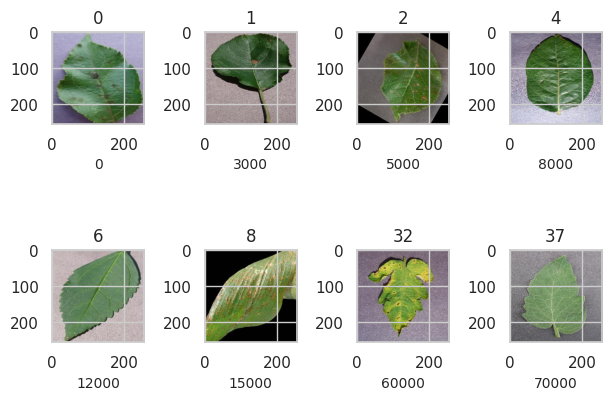

In [17]:
def show_image(image, label):
    print("Label :" + train.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))


image_list = [0, 3000, 5000, 8000, 12000, 15000, 60000, 70000]

chs = 0
for img in image_list:
    chs += 1
    plt.subplot(2,4,chs)
    print(Fore.GREEN)
    plt.tight_layout()
    plt.xlabel(img,fontsize=10)
    plt.title(train[img][1])
    show_image(*train[img])

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

**Permutar:** Devuelve una vista de la entrada tensorial original con sus dimensiones permutadas.

**Nota:** Permutar no copia ni asigna memoria.

In [18]:
batch_size = 32

* **[Table of Content](#0)**

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

**Cargador de Datos:**
- El Cargador de Datos es una clase para la utilidad de carga de datos de PyTorch. Se utiliza para importar datos desde conjuntos de datos.

- El Cargador de Datos tiene dos tipos de conjuntos de datos: conjuntos de datos de estilo mapa y conjuntos de datos de estilo iterable. La clase Cargador de Datos de PyTorch es una herramienta importante para ayudarte a preparar, gestionar y entregar tus datos a tus redes de aprendizaje profundo.

- Puedes leer los tutoriales principales sobre este concepto en este <a href="https://pytorch.org/tutorials/beginner/basics/data_tutorial.html">**Enlace**</a>


 shuffle=True
Solo en train_dataloader.

Mezcla aleatoriamente los datos en cada época de entrenamiento.

Ayuda a evitar que el modelo aprenda el orden de los datos.

📦 batch_size
Este es el número de ejemplos que se cargarán en cada lote.
Debes definirlo antes (por ejemplo, batch_size = 32).

🔄 ¿Cómo funciona?
Cuando num_workers > 0, PyTorch crea procesos separados que:

Leen imágenes del disco.

Aplican las transformaciones (e.g., transforms.ToTensor()).

Entregan los lotes al proceso principal para entrenamiento.

Este paralelismo permite preparar el siguiente lote mientras la red entrena con el actual, acelerando todo el proceso.

📌 Ejemplo:
Si tienes un SSD y un CPU con 4 núcleos, usar num_workers=2 o 4 puede reducir cuellos de botella al evitar que el entrenamiento espere a que los datos estén listos.

✅ ¿Qué hace?
Cuando se entrena en GPU (cuda), los datos necesitan ser transferidos desde la RAM del sistema a la memoria de la GPU.
Este paso puede volverse un cuello de botella si no se optimiza.

Al usar pin_memory=True:

Los tensores se colocan en una zona de la RAM llamada pinned memory (memoria fija).

La GPU puede copiar desde esa zona más rápido que desde memoria normal.

🧠 ¿Por qué es más rápido?
Porque la transferencia de pinned memory a GPU usa mecanismos DMA (Direct Memory Access), lo cual es más eficiente que una transferencia estándar.

In [19]:
# DataLoaders for training and validation
train_dataloader = DataLoader(train, batch_size, shuffle=True, num_workers=2, pin_memory=True)
valid_dataloader = DataLoader(valid, batch_size, num_workers=2, pin_memory=True)

* **[Table of Content](#0)**

<a id="5"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Device of Process</p>

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>



**GPU/CPU:**
   - When designing your deep learning architecture, your decision to include GPUs relies on several factors:

   - Memory bandwidth—including GPUs can provide the bandwidth needed to accommodate large datasets.
    
   - Dataset size GPUs in parallel can scale more easily than CPUs, enabling you to process massive datasets faster.
    
   - Optimization a downside of GPUs is that optimization of long-running individual tasks is sometimes more difficult than with CPUs.



🧠 CPU (Unidad Central de Procesamiento)
Es el cerebro general del computador.

Ideal para tareas secuenciales, operaciones de control, lógica y gestión del sistema.

Tiene pocos núcleos (cores) muy potentes, normalmente entre 4 y 16.

Buena para tareas que requieren decisiones complejas o flujo de control.

🎮 GPU (Unidad de Procesamiento Gráfico)
Diseñada originalmente para procesar gráficos e imágenes.

Tiene miles de núcleos simples, ideales para cálculos en paralelo.

Excelente para realizar muchas operaciones matemáticas repetitivas al mismo tiempo, como en redes neuronales.



1. Memory Bandwidth (Ancho de banda de memoria)
Las GPUs tienen una memoria especializada (VRAM) con alta velocidad de transferencia.

Esto permite alimentar grandes volúmenes de datos (como imágenes de alta resolución) rápidamente a los modelos.

Dataset Size y Escalabilidad
Las GPUs están hechas para manejar cientos o miles de operaciones simultáneamente.

Cuando tienes datasets masivos (como millones de imágenes), una GPU puede dividir el trabajo y procesarlo mucho más rápido que una CPU.

Además, puedes usar varias GPUs en paralelo, lo que escala mejor que usar varias CPUs.

3. Optimización de tareas largas
Desventaja: Las GPUs no siempre son eficientes para tareas individuales y largas que no se pueden paralelizar fácilmente.

Por ejemplo, si estás procesando una sola muestra muy compleja o necesitas mucha lógica condicional, la CPU puede optimizar mejor ese tipo de carga.

🧪 Ejemplo concreto:
Si estás entrenando una red convolucional (CNN) con 50,000 imágenes de 224x224 píxeles:

En CPU: puede tardar horas o incluso días.

En GPU: puede completarse en minutos u horas, aprovechando la paralelización masiva.

In [20]:
# for moving data into GPU (if available)
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available:
        return torch.device("cuda")
    else:
        return torch.device("cpu")

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


   - You can read more about this in <a href="https://pytorch.org/blog/pytorch-0_4_0-migration-guide/#writing-device-agnostic-code">**HERE**</a>


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

**Datos al dispositivo:**

- En PyTorch, es crucial usar .to(device) cuando se desea mover explícitamente tensores (datos) o modelos completos (incluyendo capas y parámetros) a un dispositivo específico para su cálculo. **Aquí explicamos por qué:**

- **Ubicación consistente del dispositivo:**
Al trabajar con GPU (unidades de procesamiento gráfico), es necesario asegurarse de que tanto el modelo como los datos residan en el mismo dispositivo (CPU o GPU).
Si los datos están en la CPU y el modelo en la GPU (o viceversa), se producirá un error de ejecución.
Para evitar esto, use .to(device) para transferir tanto los datos como el modelo al mismo dispositivo.

**Evitar operaciones con dispositivos mixtos:**
Si una operación involucra un tensor en la GPU y otro en la CPU, PyTorch generará un error de tiempo de ejecución.
Por ejemplo, intentar realizar operaciones entre tensores en diferentes dispositivos generará un error como: "Se esperaba un objeto de tipo de dispositivo cuda, pero se obtuvo un tipo de dispositivo cpu".

**Configuración del dispositivo:**
Puede establecer la variable "dispositivo" como "cuda" si hay una GPU disponible; de ​​lo contrario, configúrela como "cpu".
A continuación, mueva el modelo y los datos al dispositivo especificado:

Este bloque de código define una función llamada to_device, y su propósito es mover datos (tensores, listas de tensores, etc.) a un dispositivo (CPU o GPU) de forma segura y eficiente.

In [21]:
# for moving data to device (CPU or GPU)
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

**Cargador de datos del dispositivo:**

- Hay un excelente tutorial para esta sección que puedes ver <a href="https://pytorch.org/docs/stable/data.html">**AQUÍ**</a>.

- En la celda de abajo, podemos combinar nuestro cargador de datos con el dispositivo principal.

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>



   - To understand what yield does, you must understand what
<a href="https://docs.python.org/3/glossary.html#term-generator">**generators**</a> are. And before you can understand generators, you must understand <a href="https://docs.python.org/3/glossary.html#term-iterable">**iterables**</a>.
    
    
   - <a href="https://www.geeksforgeeks.org/python-yield-keyword/">**yield**</a>  is a keyword that is used like return, except the function will return a generator.

In [22]:
# for loading in the device (GPU if available else CPU)
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dataloader, device):
        self.dataloader = dataloader
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dataloader:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dataloader)

In [23]:
device = get_default_device()
device

device(type='cuda')

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

- CUDA es un modelo de programación y un kit de herramientas informáticas desarrollado por NVIDIA. Permite realizar operaciones de computación intensiva con mayor rapidez mediante la paralelización de tareas en varias GPU. CUDA es la API principal para el aprendizaje profundo, aunque existen otras opciones, como OpenCL. PyTorch ofrece compatibilidad con CUDA en la biblioteca torch.cuda.

✅ ¿Qué está haciendo?
Estas líneas envuelven tus DataLoaders originales (train_dataloader, valid_dataloader) dentro de una clase llamada DeviceDataLoader, cuyo propósito es mover automáticamente cada batch de datos al dispositivo correcto (GPU o CPU).

In [24]:
# Moving data into GPU, WrappedDataLoader
train_dataloader = DeviceDataLoader(train_dataloader, device)
valid_dataloader = DeviceDataLoader(valid_dataloader, device)

* **[Table of Content](#0)**

<a id="6"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Neural Network (CNN)</p>

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


**Function of Acc:**


   - We can compare the outputs of model with the true labels.

Este código define una función llamada accuracy, que se usa para calcular la precisión (accuracy) de un modelo de clasificación en PyTorch.

In [25]:
# for calculating the accuracy
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


**Classification Base:**


   - Let's create a step by step classification base module:
    
   - **First, Training_step:** the images and labels take values from batch. The output of model is a type of images and the loss is calculate from **F** cross entropy function (out, labels). It seems that the prediction is compared with the actual values in labels.
    
   - **Second, validation step:** is just like the above one. But it has another attribute call acc.
    
   - **Third, validation_epoch_end:** calculate the losses and acces of each batchs and epochs.
    
   - **Fourth, epoch_end:** That shows the final results of everything.
    
    

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

**Base de Clasificación:**

- Vamos a crear un módulo base de clasificación paso a paso:

- **Primero, Paso de Entrenamiento:** las imágenes y las etiquetas toman valores del lote. La salida del modelo es un tipo de imágenes y la pérdida se calcula a partir de la función de entropía cruzada **F** (salida, etiquetas). Parece que la predicción se compara con los valores reales en las etiquetas.

- **Segundo, Paso de Validación:** es igual al anterior, pero tiene otro atributo llamado acc.

- **Tercero, Validación_Epoca_Fin:** calcula las pérdidas y el acceso de cada lote y época.

- **Cuarto, Epoch_Fin:** muestra los resultados finales de todo.

Esta clase define una base para modelos de clasificación de imágenes en PyTorch. No contiene arquitectura aún, pero sí la lógica común de entrenamiento y validación.

In [26]:
class ImageClassificationBase(nn.Module):

    def training_step(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss

    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}

    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}

    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


**ConvBlock:**


   - Number of inputs, outputs, kernel size and padding are here.
    
   - Also we have Batchnomalization
    
   - You see other tutorials and ways in this <a href="https://www.geeksforgeeks.org/python-yield-keyword/">**lecture**</a>
    
   - For Maxpooling you can see this <a href="https://pytorch.org/docs/stable/generated/torch.nn.MaxPool2d.html">**Link**</a>
    
    

 Este código define una función personalizada llamada ConvBlock, que construye un bloque de capas convolucionales muy común en redes neuronales convolucionales (CNNs), especialmente en clasificación de imágenes.

In [27]:
# convolution block with BatchNormalization
def ConvBlock(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
             nn.BatchNorm2d(out_channels),
             nn.ReLU(inplace=True)]
    if pool:
        layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


**CNN:**


   - And the CNN part
    
   - We can use the class of **ImageClassificationBase** for taking methods like calculating the loss and acc of epochs. And after that, we can set our layers. We can use more layers but in this case, the size of images don't allow to do that **Going to be zero**. In the second part, we have to connect layers to each other. The output of layer number **N**, is the input of layer number **N+1**. And so on.

* **[Table of Content](#0)**

🧠 Objetivo del modelo
Este modelo:

Usa bloques convolucionales definidos con ConvBlock(...).

Usa residual connections al estilo de ResNet, que ayudan a entrenar redes profundas evitando el problema del "desvanecimiento del gradiente".

Finaliza con un classifier que predice la enfermedad de una planta (clasificación multiclase).

In [28]:
# resnet architecture
class CNN_NeuralNet(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()

        self.conv1 = ConvBlock(in_channels, 64)
        self.conv2 = ConvBlock(64, 128, pool=True)
        self.res1 = nn.Sequential(ConvBlock(128, 128), ConvBlock(128, 128))

        self.conv3 = ConvBlock(128, 256, pool=True)
        self.conv4 = ConvBlock(256, 512, pool=True)
        #self.conv5 = ConvBlock(256, 256, pool=True)
        #self.conv6 = ConvBlock(256, 512, pool=True)
        #self.conv7 = ConvBlock(512, 512, pool=True)

        self.res2 = nn.Sequential(ConvBlock(512, 512), ConvBlock(512, 512))
        self.classifier = nn.Sequential(nn.MaxPool2d(4),
                                       nn.Flatten(),
                                       nn.Linear(512, num_diseases))

    def forward(self, x): # x is the loaded batch
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        #out = self.conv5(out)
        #out = self.conv6(out)
        #out = self.conv7(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        return out


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


**Model:**


   - Now it's time to connet the model to_device for using GPU

Este fragmento de código es clave, ya que define tu modelo de clasificación de imágenes y lo mueve automáticamente a GPU (si está disponible). Vamos a desglosarlo por partes.

In [29]:
# defining the model and moving it to the GPU
# 3 is number of channels RGB, len(train.classes()) is number of diseases.
model = to_device(CNN_NeuralNet(3, len(train.classes)), device)
model

CNN_NeuralNet(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inpl


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


**Model Evaluate / Model Optimizer:**


   - We can define evaluate between model output and validation labels.
    
   - There is no reason to track gradients when updating the weights. The torch.no_grad() tells PyTorch to not calculate the gradients, and the program explicitly uses it here (as with most neural networks) in order to not update the gradients when it is updating the weights as that would affect the back propagation. It’s commonly used during weight updates to avoid interfering with backpropagation.
    
   - For getting learning rate from the model, we can use 'lr' as learning rate in optimizer.param_groups.

Evalúa el modelo en un conjunto de validación (o prueba), sin entrenar, para obtener las métricas de rendimiento (pérdida y precisión).

In [30]:
# for training
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

✅ ¿Qué hace?
Devuelve la tasa de aprendizaje actual (learning rate) del optimizador.

In [31]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


**Hyperparameters Function:**


   - Now it's time to create a function that get **epochs, learning rate, train and validation loader and optim function.**.
    
   - Clear GPU memory after PyTorch model training without restarting kernel with **torch.cuda.empty_cache()**   
    

 Resumen visual
Parte	¿Qué hace?
OneCycleLR	Cambia el lr dinámicamente en forma de ciclo
grad_clip	Evita explosión de gradientes
optimizer.step()	Actualiza los pesos con los gradientes
evaluate(...)	Calcula pérdida y precisión en validación
history.append(...)	Guarda resultados por época

In [32]:
def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader, weight_decay=0,
                grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []  #For collecting the results

    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # scheduler for one cycle learniing rate
    #Sets the learning rate of each parameter group according to the 1cycle learning rate policy.
    #The 1cycle policy anneals the learning rate from an initial learning rate to some
    #maximum learning rate and then from that maximum learning rate to some minimum learning rate
    #much lower than the initial learning rate.
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr,
                                                epochs=epochs, steps_per_epoch=len(train_loader))


    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()

            # gradient clipping
            #Clip the gradients of an iterable of parameters at specified value.
            #All from pytorch documantation.
            if grad_clip:
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)

            optimizer.step()
            optimizer.zero_grad()

            # recording and updating learning rates
            lrs.append(get_lr(optimizer))
            sched.step()
             # validation

        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)

    return history



<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


**Training Model:**


   - Evaluate function added to history of model.
    
   - Then we can define our hyperparameters like number of epochs, learning rate and ... .
    
   - Now we can update history with fit_OneCycle function (Adding two function together).
    Attention to history = [] in the second function. Now we have model evaluation.
    

#5️⃣ Evaluación (Evaluation)
python
Copiar
Editar


In [33]:
%%time
history = [evaluate(model, valid_dataloader)]
history

CPU times: user 1min 2s, sys: 3.98 s, total: 1min 6s
Wall time: 1min 9s


[{'val_loss': 3.6385581493377686, 'val_acc': 0.0239204540848732}]

define hiperparámetros clave para entrenar una red neuronal en PyTorch.

entrena tu modelo usando la función fit_OneCycle(...) y mide cuánto tiempo tarda en ejecutarse.

In [34]:
num_epoch = 5
lr_rate = 0.01
grad_clip = 0.15
weight_decay = 1e-4
optims = torch.optim.Adam

In [35]:
%%time
history += fit_OneCycle(num_epoch, lr_rate, model, train_dataloader, valid_dataloader,
                             grad_clip=grad_clip,
                             weight_decay=weight_decay,
                             opt_func=optims)

Epoch [0], train_loss: 0.6941, val_loss: 0.8792, val_acc: 0.7506
Epoch [1], train_loss: 0.3321, val_loss: 0.4715, val_acc: 0.8480
Epoch [2], train_loss: 0.2362, val_loss: 0.1675, val_acc: 0.9451
Epoch [3], train_loss: 0.1054, val_loss: 0.0561, val_acc: 0.9811
Epoch [4], train_loss: 0.0260, val_loss: 0.0219, val_acc: 0.9943
CPU times: user 44min 21s, sys: 33min 54s, total: 1h 18min 15s
Wall time: 1h 18min 57s


* **[Table of Content](#0)**

<a id="7"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Result</p>


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


**Acc/Loss Plot:**


   - If you call **history** you can see the parameters in it. We want to plot **val_acc, val_loss and train_loss**.
    

In [36]:
val_acc = []
val_loss = []
train_loss = []

for i in history:
    val_acc.append(i['val_acc'])
    val_loss.append(i['val_loss'])
    train_loss.append(i.get('train_loss'))

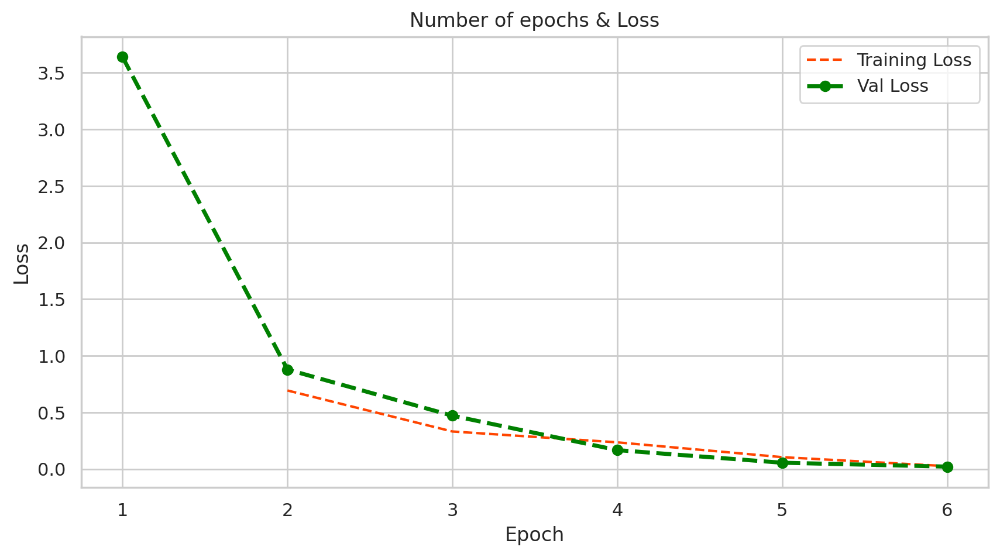

In [37]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, train_loss, 'r--', color= 'orangered')
plt.plot(epoch_count, val_loss, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,7,1))
plt.show();

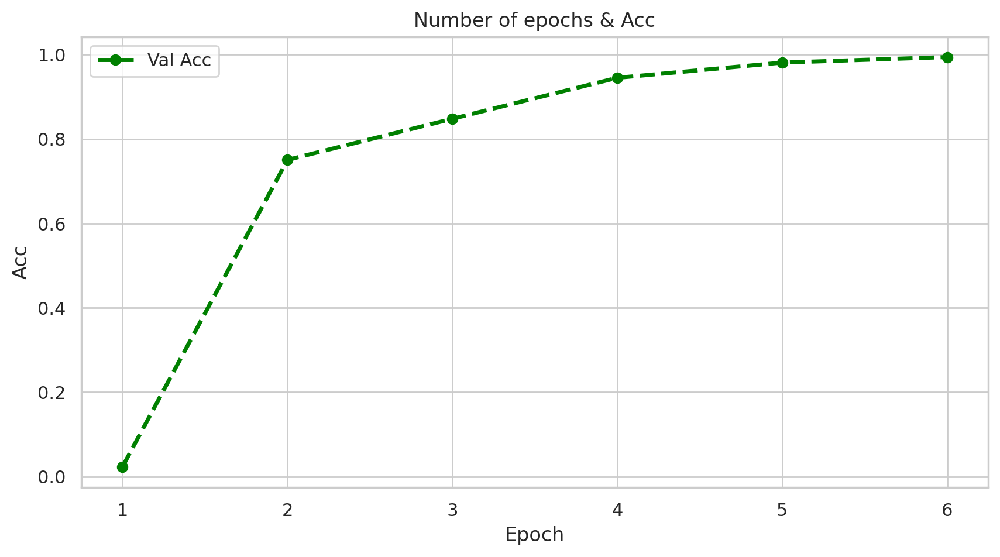

In [38]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, val_acc, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Val Acc'])
plt.title('Number of epochs & Acc')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,7,1))
plt.show();


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


**Use Model for Test Dataset:**


   - Now it's time to test the model on the **test_dir**.

#6️⃣ Despliegue (Deployment)
python
Copiar
Editar


In [39]:
test = ImageFolder(test_dir, transform=transforms.ToTensor())
test_images = sorted(os.listdir(test_dir + '/test'))
print(Fore.GREEN)
print(test_images)
print(len(test_images))


['AppleCedarRust1.JPG', 'AppleCedarRust2.JPG', 'AppleCedarRust3.JPG', 'AppleCedarRust4.JPG', 'AppleScab1.JPG', 'AppleScab2.JPG', 'AppleScab3.JPG', 'CornCommonRust1.JPG', 'CornCommonRust2.JPG', 'CornCommonRust3.JPG', 'PotatoEarlyBlight1.JPG', 'PotatoEarlyBlight2.JPG', 'PotatoEarlyBlight3.JPG', 'PotatoEarlyBlight4.JPG', 'PotatoEarlyBlight5.JPG', 'PotatoHealthy1.JPG', 'PotatoHealthy2.JPG', 'TomatoEarlyBlight1.JPG', 'TomatoEarlyBlight2.JPG', 'TomatoEarlyBlight3.JPG', 'TomatoEarlyBlight4.JPG', 'TomatoEarlyBlight5.JPG', 'TomatoEarlyBlight6.JPG', 'TomatoHealthy1.JPG', 'TomatoHealthy2.JPG', 'TomatoHealthy3.JPG', 'TomatoHealthy4.JPG', 'TomatoYellowCurlVirus1.JPG', 'TomatoYellowCurlVirus2.JPG', 'TomatoYellowCurlVirus3.JPG', 'TomatoYellowCurlVirus4.JPG', 'TomatoYellowCurlVirus5.JPG', 'TomatoYellowCurlVirus6.JPG']
33


In [40]:
def predict_image(img, model):
    """Converts image to array and return the predicted class
        with highest probability"""
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label

    return train.classes[preds[0].item()]

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


**Final Prediction:**


   - Let's see how the model works.


Label: AppleCedarRust2.JPG , Predicted: Apple___Cedar_apple_rust


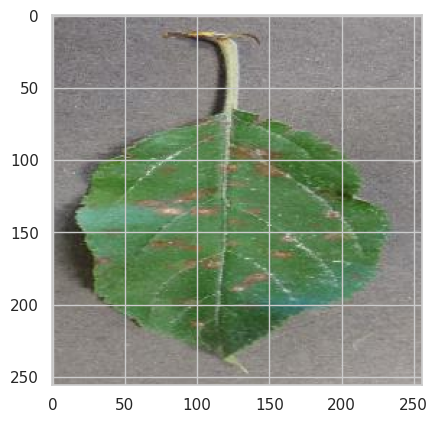

In [41]:
# predicting first image
img, label = test[1]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[1], ', Predicted:', predict_image(img, model))


Label: AppleScab2.JPG , Predicted: Apple___Apple_scab


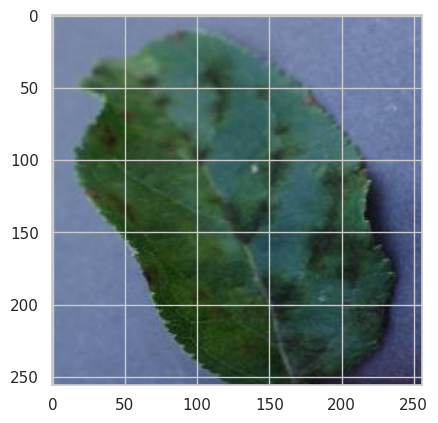

In [42]:
# predicting first image
img, label = test[5]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[5], ', Predicted:', predict_image(img, model))


Label: CornCommonRust3.JPG , Predicted: Corn_(maize)___Common_rust_


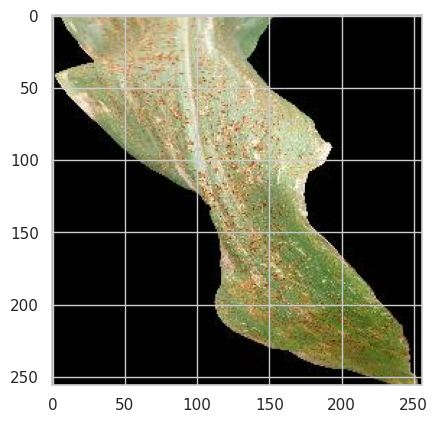

In [43]:
# predicting first image
img, label = test[9]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[9], ', Predicted:', predict_image(img, model))


Label: PotatoHealthy2.JPG , Predicted: Potato___healthy


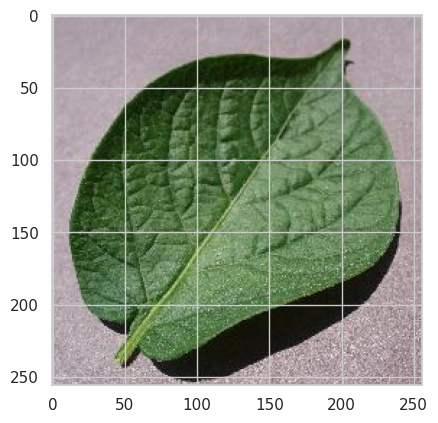

In [44]:
# predicting first image
img, label = test[16]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[16], ', Predicted:', predict_image(img, model))


Label: TomatoHealthy4.JPG , Predicted: Tomato___healthy


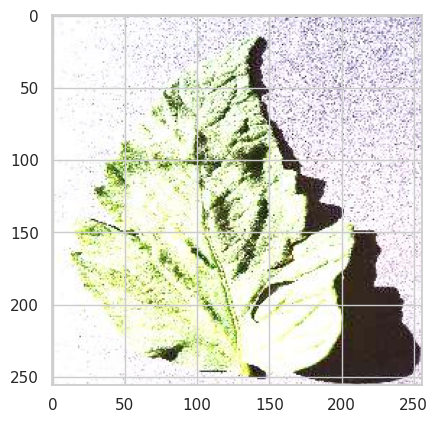

In [45]:
# predicting first image
img, label = test[26]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[26], ', Predicted:', predict_image(img, model))

In [46]:
# getting all predictions (actual label vs predicted)
for i, (img, label) in enumerate(test):
    print(Fore.GREEN)
    print('Label:', test_images[i], ', Predicted:', predict_image(img, model))


Label: AppleCedarRust1.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleCedarRust2.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleCedarRust3.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleCedarRust4.JPG , Predicted: Apple___Cedar_apple_rust

Label: AppleScab1.JPG , Predicted: Apple___Apple_scab

Label: AppleScab2.JPG , Predicted: Apple___Apple_scab

Label: AppleScab3.JPG , Predicted: Apple___Apple_scab

Label: CornCommonRust1.JPG , Predicted: Corn_(maize)___Common_rust_

Label: CornCommonRust2.JPG , Predicted: Corn_(maize)___Common_rust_

Label: CornCommonRust3.JPG , Predicted: Corn_(maize)___Common_rust_

Label: PotatoEarlyBlight1.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight2.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight3.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight4.JPG , Predicted: Potato___Early_blight

Label: PotatoEarlyBlight5.JPG , Predicted: Potato___Early_blight

Label: PotatoHealthy1.JPG , Predi

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


   - Everything is good and the model predict well the test dataset.
    
   - **Happy Learning Guys**

# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Warm Wishes</p>

In [ ]:
from google.colab import files
from PIL import Image

# Subir imagen desde el sistema local
uploaded = files.upload()


In [ ]:
# Elegimos el nombre del archivo subido
img_path = list(uploaded.keys())[0]

# Cargar la imagen usando PIL y convertirla a RGB por seguridad
img = Image.open(img_path).convert('RGB')

# Aplicar las mismas transformaciones que en entrenamiento
transform = transforms.ToTensor()
img_tensor = transform(img)


In [ ]:
# Mostrar imagen
plt.imshow(img_tensor.permute(1, 2, 0))
plt.axis('off')
plt.show()

# Predecir la clase
predicted_class = predict_image(img_tensor, model)
print(Fore.GREEN + f"🔍 La clase predicha es: {predicted_class}")


In [56]:
from google.colab import files
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms

# Subir imagen desde el sistema local
uploaded = files.upload()

Saving images.jpg to images.jpg


In [57]:


# Obtener el nombre del archivo subido
img_path = list(uploaded.keys())[0]

# Cargar y convertir a RGB por seguridad
img = Image.open(img_path).convert('RGB')

# Redimensionar a un tamaño manejable (igual para entrenamiento y predicción)
# Puedes ajustar (256, 256) o (128, 128) según lo que usaste en el entrenamiento
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Reescalar la imagen
    transforms.ToTensor()
])




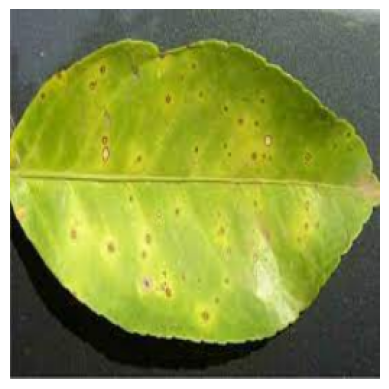

🔍 La clase predicha es: Corn_(maize)___Common_rust_


In [58]:
# Aplicar transformación
img_tensor = transform(img)

# Mostrar imagen
plt.imshow(img_tensor.permute(1, 2, 0))
plt.axis('off')
plt.show()

# Predecir la clase usando tu modelo ya entrenado
predicted_class = predict_image(img_tensor, model)
print(Fore.GREEN + f"🔍 La clase predicha es: {predicted_class}")